# Gating Strategy Visualizations & Parameter Export (derived_8.3)

This notebook evaluates unsupervised and univariate gating strategies on the `derived_8.3` dataset split ($K=2$ regimes), visualizes regime properties and feature-target correlation drifts, and exports fitted clustering parameters (imputation means, scalers, and KMeans centroids) for downstream experiment reference.

## 1. Imports and Custom Plot Styling

We import the required libraries and setup standard plotting parameters and color palettes for $K=2$ gating regime visual diagnostics.

In [1]:
import os
import sys
import json
import joblib
import importlib.util
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples

# Set random seed for reproducibility
np.random.seed(42)

# Set plotting defaults
plt.style.use("seaborn-v0_8-whitegrid" if "seaborn-v0_8-whitegrid" in plt.style.available else "default")
plt.rcParams["font.sans-serif"] = "DejaVu Sans"
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["figure.dpi"] = 300
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 12

# Color palettes for K=2
PALETTE_K2 = ["#D95F02", "#1B9E77"]  # Orange / Teal contrast
PALETTE_DIVERGING = "coolwarm"

print("Imports and styling initialized.")

Imports and styling initialized.


## 2. Load and Clean Dataset

We load the `train.csv`, `val.csv`, and `station_static_features.csv` splits for `derived_8.3` and dynamically import `OVERALL_SELECTED_FEATURES_V0` from `data/splits/derived_8.3/dataset_metadata.py`.

In [2]:
# Define relative paths from notebook directory
PROJECT_ROOT = "../../.."
DATA_DIR = os.path.join(PROJECT_ROOT, "data/splits/derived_8.3")
TRAIN_PATH = os.path.join(DATA_DIR, "train.csv")
VAL_PATH = os.path.join(DATA_DIR, "val.csv")
STATION_PATH = os.path.join(DATA_DIR, "station_static_features.csv")
METADATA_PATH = os.path.join(DATA_DIR, "dataset_metadata.py")

# Load datasets
train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
station_df = pd.read_csv(STATION_PATH)

# Ensure 'month' column is extracted from 'date'
if 'month' not in train_df.columns:
    train_df['month'] = pd.to_datetime(train_df['date']).dt.month
if 'month' not in val_df.columns:
    val_df['month'] = pd.to_datetime(val_df['date']).dt.month

# Load metadata dynamically
spec = importlib.util.spec_from_file_location("dataset_metadata", METADATA_PATH)
dataset_metadata = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dataset_metadata)
OVERALL_SELECTED_FEATURES_V0 = dataset_metadata.OVERALL_SELECTED_FEATURES_V0

print("Loaded derived_8.3 splits:")
print(f"  Train shape:                  {train_df.shape}")
print(f"  Val shape:                    {val_df.shape}")
print(f"  Station features shape:       {station_df.shape}")
print(f"  OVERALL_SELECTED_FEATURES_V0: {len(OVERALL_SELECTED_FEATURES_V0)} features")

Loaded derived_8.3 splits:
  Train shape:                  (12678, 500)
  Val shape:                    (6219, 500)
  Station features shape:       (9, 53)
  OVERALL_SELECTED_FEATURES_V0: 50 features


/tmp/job.1971555/ipykernel_3128766/4249602959.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_df['month'] = pd.to_datetime(train_df['date']).dt.month
/tmp/job.1971555/ipykernel_3128766/4249602959.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  val_df['month'] = pd.to_datetime(val_df['date']).dt.month


## 3. Gating Evaluation Framework

We define helper functions to compute quantile-based thresholds, label assignments for $K=2$ strategies, and diagnostic metrics (regime group sizes, Top 20 feature-target correlation divergence, and maximum feature correlation drift).

Supported $K=2$ strategies:
- `Univariate_G_API`: 2-bin quantile threshold on Antecedent Precipitation Index `G_API`.
- `Clustering_Dynamic`: 2-cluster KMeans on dynamic physical features `["SMAP_sm_pm_interp_lag1", "G_API", "LST_modis"]`.
- `Seasonal_Binary`: Seasonal regime split (Summer May-Oct vs Winter Nov-Apr).
- `Clustering_V0_Full`: 2-cluster KMeans on full `OVERALL_SELECTED_FEATURES_V0`.

In [3]:
# Helper to perform quantile-based binning
def quantile_bin(df, col, K=2):
    val = df[col].values
    if K == 2:
        q50 = np.nanquantile(val, 0.5)
        return np.where(val < q50, 0, 1)
    else:
        raise ValueError(f"Only K=2 is supported in this notebook, got K={K}")

# Helper to prepare clustering data with mean imputation and standard scaling
def prepare_clustering_data(df, features):
    X = df[features].copy()
    X = X.fillna(X.mean())
    scaler = StandardScaler()
    return scaler.fit_transform(X)

# Strategy label generator restricted to K=2
def get_labels_for_strategy(df, name, K=2):
    if K != 2:
        raise ValueError(f"This notebook is restricted to K=2 strategies, got K={K}")
        
    if name == "Univariate_G_API":
        return quantile_bin(df, "G_API", K=2)
    elif name == "Seasonal_Binary":
        month = df['month'] if 'month' in df.columns else pd.to_datetime(df['date']).dt.month
        cond_k2 = [
            month.isin([5, 6, 7, 8, 9, 10]),
            month.isin([11, 12, 1, 2, 3, 4])
        ]
        return np.select(cond_k2, [0, 1], default=0)
    elif name == "Clustering_Dynamic":
        cols_dyn = ["SMAP_sm_pm_interp_lag1", "G_API", "LST_modis"]
        X = prepare_clustering_data(df, cols_dyn)
        kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
        return kmeans.fit_predict(X)
    elif name == "Clustering_V0_Full":
        X = prepare_clustering_data(df, OVERALL_SELECTED_FEATURES_V0)
        kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
        return kmeans.fit_predict(X)
    else:
        raise ValueError(f"Strategy {name} is not supported.")

# Gating evaluation helper to return clean info dict
def get_gating_metrics_and_matrix(df, labels, strategy_name, K=2, features=None, target_col='soil_moisture_5cm'):
    if features is None:
        features = OVERALL_SELECTED_FEATURES_V0
        
    labels = np.asarray(labels)
    unique_labels, counts = np.unique(labels, return_counts=True)
    
    # 1. Compute global correlations
    global_corrs = df[features].corrwith(df[target_col]).abs().fillna(0)
    top_features = global_corrs.sort_values(ascending=False).head(20).index.tolist()
    
    # 2. Compute group-specific correlations
    group_corrs = {}
    for label in unique_labels:
        mask = (labels == label)
        if mask.sum() > 10:
            corrs = df.loc[mask, features].corrwith(df.loc[mask, target_col]).fillna(0)
            group_corrs[label] = corrs
        else:
            group_corrs[label] = pd.Series(0, index=features)
            
    corr_matrix = pd.DataFrame(group_corrs)
    
    # Standard deviation across groups
    std_by_feat = corr_matrix.std(axis=1, ddof=0)
    div_top20 = std_by_feat.loc[top_features].mean()
    
    # Max drift (max - min correlation)
    max_drift_by_feat = corr_matrix.max(axis=1) - corr_matrix.min(axis=1)
    max_drift = max_drift_by_feat.max()
    max_drift_feat = max_drift_by_feat.idxmax()
    
    return {
        "strategy": strategy_name,
        "K": K,
        "labels": labels,
        "counts": counts,
        "div_top20": div_top20,
        "max_drift": max_drift,
        "max_drift_feature": max_drift_feat,
        "corr_matrix": corr_matrix,
        "top_features": top_features
    }

print("Gating evaluation and labeling framework defined for K=2.")

Gating evaluation and labeling framework defined for K=2.


## 4. Execute Top Gating Strategies (K=2)

We execute all 4 $K=2$ gating strategies (`Univariate_G_API`, `Clustering_Dynamic`, `Seasonal_Binary`, `Clustering_V0_Full`) on the Washington training set, extract their labels, calculate feature-target correlations per group, and display a summary table.

In [4]:
# Execute K=2 strategies
configs = [
    {"name": "Univariate_G_API", "K": 2},
    {"name": "Clustering_Dynamic", "K": 2},
    {"name": "Seasonal_Binary", "K": 2},
    {"name": "Clustering_V0_Full", "K": 2}
]

gating_results = []
for cfg in configs:
    labels = get_labels_for_strategy(train_df, cfg["name"], cfg["K"])
    res = get_gating_metrics_and_matrix(train_df, labels, cfg["name"], cfg["K"], OVERALL_SELECTED_FEATURES_V0)
    gating_results.append(res)

# Summary table
summary_data = []
for res in gating_results:
    summary_data.append({
        "Strategy": res["strategy"],
        "K": res["K"],
        "Group Sizes": ", ".join([str(c) for c in res["counts"]]),
        "Top 20 Divergence": round(res["div_top20"], 4),
        "Max Drift": round(res["max_drift"], 4),
        "Drift Feature": res["max_drift_feature"]
    })
df_summary = pd.DataFrame(summary_data)
print("=== GATING STRATEGIES SUMMARY (K=2) ===")
display(df_summary)

# Save summary table
df_summary.to_csv("gating_strategies_summary.csv", index=False)

=== GATING STRATEGIES SUMMARY (K=2) ===


/scratch/user/u.rp352032/MDR-Project/notebooks/.venv/lib64/python3.12/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/scratch/user/u.rp352032/MDR-Project/notebooks/.venv/lib64/python3.12/site-packages/numpy/lib/_function_base_impl.py:3024: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


,Strategy,K,Group Sizes,Top 20 Divergence,Max Drift,Drift Feature
0,Univariate_G_API,2,"6339, 6339",0.1553,0.5233,V_ema_LST_modis_kobs30
1,Clustering_Dynamic,2,"5723, 6955",0.1694,0.6669,V_ema_F_NDVI_kobs30
2,Seasonal_Binary,2,"6526, 6152",0.1761,0.6650,V_ema_LST_modis_kobs30
3,Clustering_V0_Full,2,"10031, 2647",0.1343,1.0089,SMAP_sm_pm_interp_rollmean30


## 5. Visualization 1: Target Soil Moisture Distributions (K=2)

We plot kernel density estimation (KDE) overlays of `soil_moisture_5cm` for each group across the 4 $K=2$ strategies in a 2x2 grid. This illustrates the level of target separation achieved by each gating strategy.

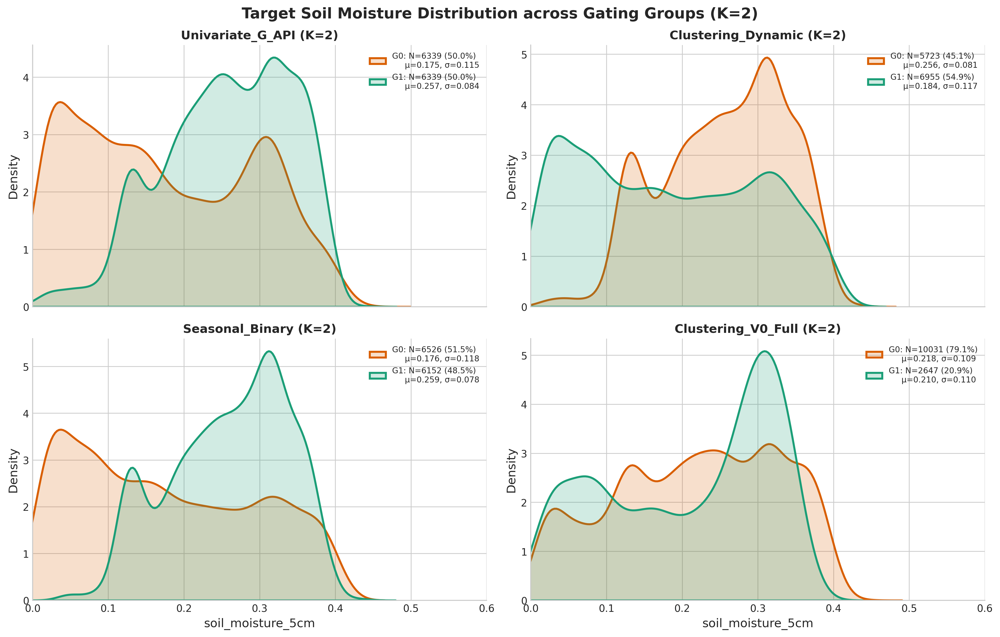

In [5]:
# Create a 2x2 subplot grid for K=2 target distributions
fig, axes = plt.subplots(2, 2, figsize=(14, 9), sharex=True)
axes = axes.flatten()

for idx, res in enumerate(gating_results):
    ax = axes[idx]
    labels = res["labels"]
    unique_labels = sorted(np.unique(labels))
    
    for g in unique_labels:
        mask = (labels == g)
        sub_target = train_df.loc[mask, 'soil_moisture_5cm']
        n_samples = len(sub_target)
        pct = n_samples / len(train_df) * 100
        mean_sm = sub_target.mean()
        std_sm = sub_target.std()
        
        sns.kdeplot(
            sub_target, 
            ax=ax, 
            label=f"G{g}: N={n_samples} ({pct:.1f}%)\n     μ={mean_sm:.3f}, σ={std_sm:.3f}", 
            fill=True, 
            alpha=0.20, 
            color=PALETTE_K2[g],
            linewidth=2
        )
        
    ax.set_title(f"{res['strategy']} (K={res['K']})", fontweight="bold", fontsize=12)
    ax.set_xlabel("soil_moisture_5cm" if idx >= 2 else "")
    ax.legend(fontsize=8, loc="upper right", framealpha=0.7)
    ax.spines[["top", "right"]].set_visible(False)
    ax.set_xlim(0, 0.6)

plt.suptitle("Target Soil Moisture Distribution across Gating Groups (K=2)", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("gating_target_distributions_grid.png", dpi=300)
plt.show()

## 6. Visualization 2: Feature-Target Correlation Drift Heatmaps (K=2)

We plot a 2x2 grid of heatmaps showing feature-target correlation values for the top 20 globally correlated features across the two groups for each $K=2$ strategy. This highlights how feature sensitivities drift across regimes.

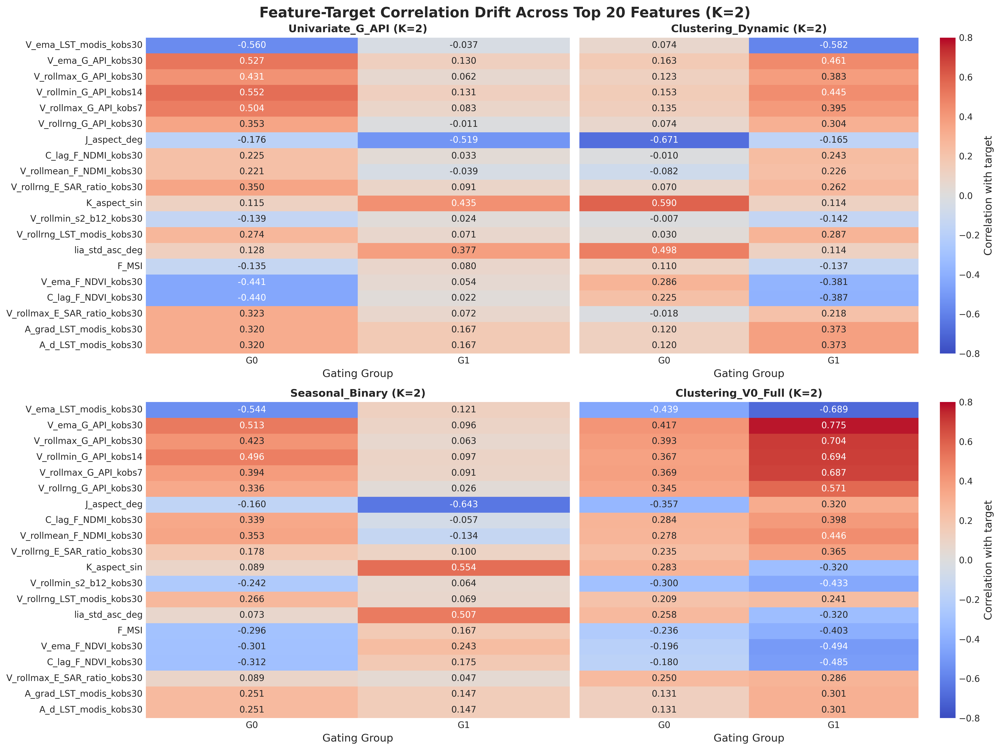

In [6]:
# Create a 2x2 subplot grid for K=2 correlation heatmaps
fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharey=True)
axes = axes.flatten()

for idx, res in enumerate(gating_results):
    ax = axes[idx]
    top_feats = res["top_features"]
    corr_matrix_sub = res["corr_matrix"].loc[top_feats]
    
    # Standardize column headers to reflect Group IDs
    corr_matrix_sub.columns = [f"G{c}" for c in corr_matrix_sub.columns]
    
    # Plot heatmap
    sns.heatmap(
        corr_matrix_sub, 
        annot=True, 
        fmt=".3f", 
        cmap=PALETTE_DIVERGING, 
        vmin=-0.8, 
        vmax=0.8, 
        center=0.0, 
        ax=ax,
        cbar=(idx in [1, 3]),
        cbar_kws={'label': 'Correlation with target'} if (idx in [1, 3]) else None
    )
    
    ax.set_title(f"{res['strategy']} (K={res['K']})", fontweight="bold", fontsize=12)
    ax.set_xlabel("Gating Group")

plt.suptitle("Feature-Target Correlation Drift Across Top 20 Features (K=2)", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig("gating_correlation_drift_grid.png", dpi=300)
plt.show()

## 7. Visualization 3: Feature Space Separation (K=2)

We analyze how the unsupervised clustering strategies partition the feature space for $K=2$:
1. Pairplot of dynamic features (`SMAP_sm_pm_interp_lag1`, `G_API`, `LST_modis`) colored by `Clustering_Dynamic` ($K=2$) cluster assignments.
2. 2D PCA projection of the 50-dimensional `OVERALL_SELECTED_FEATURES_V0` space colored by `Clustering_V0_Full` ($K=2$) cluster assignments.

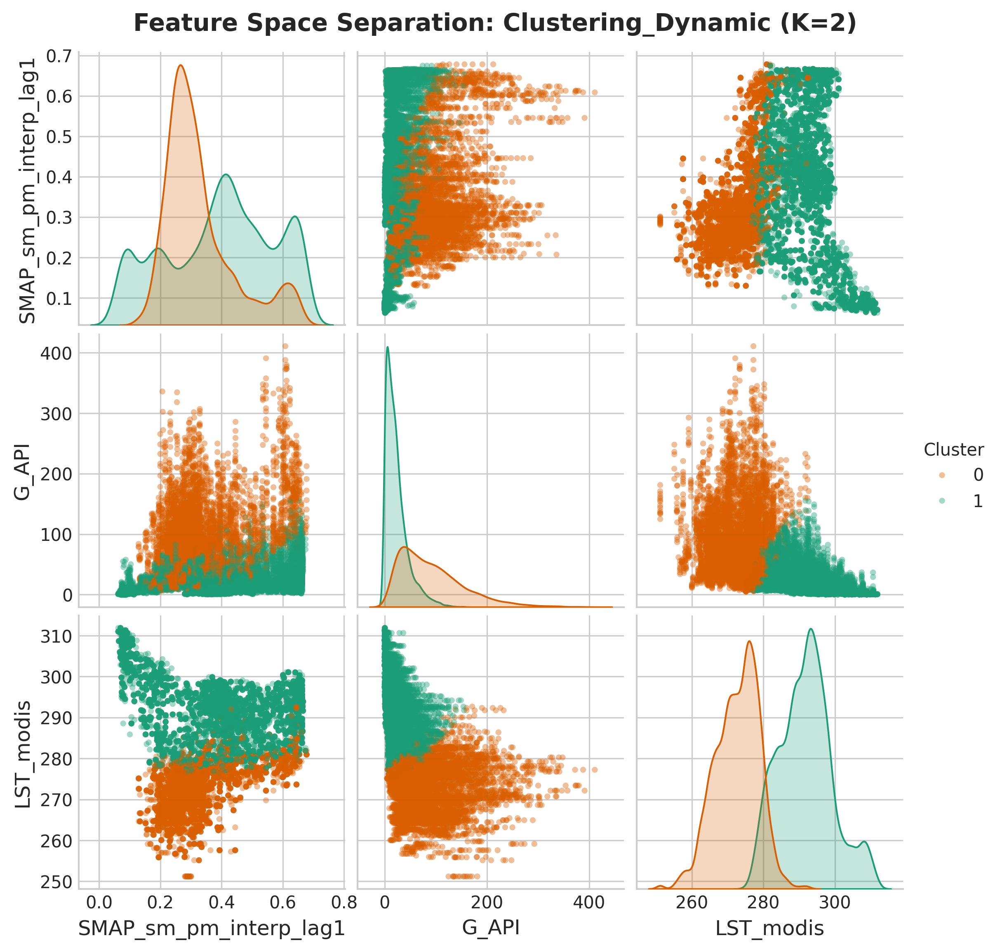

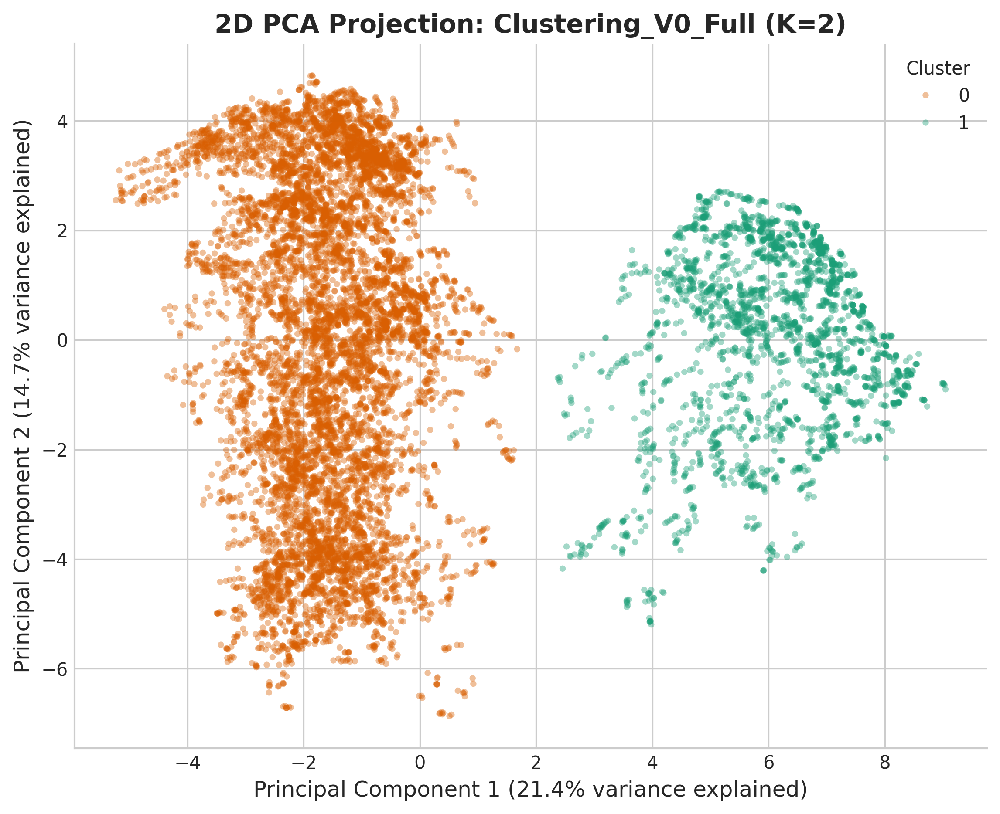

=== Top Loading Features on PC1 ===
V_rollmin_s2_b12_kobs30     0.267460
J_bio_bio15                 0.266171
F_MSI                       0.247778
J_bio_bio02                 0.225208
V_rollmean_F_NDMI_kobs30    0.223892
Name: PC1, dtype: float64

=== Top Loading Features on PC2 ===
V_ema_F_NDVI_kobs30             0.300283
C_lag_F_NDVI_kobs30             0.263624
V_rollmax_E_SAR_ratio_kobs30    0.238096
K_aspect_sin                    0.236804
V_ema_LST_modis_kobs30          0.232886
Name: PC2, dtype: float64


In [7]:
# 1. Pairplot for Clustering_Dynamic (K=2)
cols_dyn = ["SMAP_sm_pm_interp_lag1", "G_API", "LST_modis"]
df_dyn_k2 = train_df[cols_dyn].copy()
df_dyn_k2 = df_dyn_k2.fillna(df_dyn_k2.mean())
df_dyn_k2["Cluster"] = get_labels_for_strategy(train_df, "Clustering_Dynamic", 2).astype(str)

g2 = sns.pairplot(
    df_dyn_k2, 
    hue="Cluster", 
    palette=PALETTE_K2,
    diag_kind="kde",
    plot_kws={"alpha": 0.4, "s": 12, "edgecolor": "none"}
)
g2.fig.suptitle("Feature Space Separation: Clustering_Dynamic (K=2)", y=1.02, fontsize=14, fontweight="bold")
g2.savefig("clustering_dynamic_k2_pairplot.png", dpi=300)
plt.show()

# 2. PCA Projections for Clustering_V0_Full (K=2)
X_v0 = prepare_clustering_data(train_df, OVERALL_SELECTED_FEATURES_V0)
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_v0)

df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
df_pca["Cluster K=2"] = get_labels_for_strategy(train_df, "Clustering_V0_Full", 2).astype(str)

fig2, ax2 = plt.subplots(figsize=(9, 7))
sns.scatterplot(
    data=df_pca,
    x="PC1",
    y="PC2",
    hue="Cluster K=2",
    palette=PALETTE_K2,
    alpha=0.4,
    edgecolor="none",
    s=12,
    ax=ax2
)
explained_variance = pca.explained_variance_ratio_
ax2.set_xlabel(f"Principal Component 1 ({explained_variance[0]*100:.1f}% variance explained)")
ax2.set_ylabel(f"Principal Component 2 ({explained_variance[1]*100:.1f}% variance explained)")
ax2.set_title("2D PCA Projection: Clustering_V0_Full (K=2)", fontsize=14, fontweight="bold")
ax2.spines[["top", "right"]].set_visible(False)
ax2.legend(title="Cluster")
plt.savefig("clustering_v0_full_k2_pca.png", dpi=300)
plt.show()

# Calculate PCA loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=["PC1", "PC2"],
    index=OVERALL_SELECTED_FEATURES_V0
)
print("=== Top Loading Features on PC1 ===")
print(loadings["PC1"].abs().sort_values(ascending=False).head(5))
print("\n=== Top Loading Features on PC2 ===")
print(loadings["PC2"].abs().sort_values(ascending=False).head(5))

## 8. Visualization 4: Geographical Distribution of Gating Groups (K=2)

We visualize the spatial distribution of the gating groups across Washington state for each $K=2$ strategy. Since dynamic and clustering strategies assign labels per observation over time, we aggregate labels per station and determine the **dominant group** (the mode) for each station. We then map the station coordinates (`latitude` and `longitude`) colored by their dominant group.

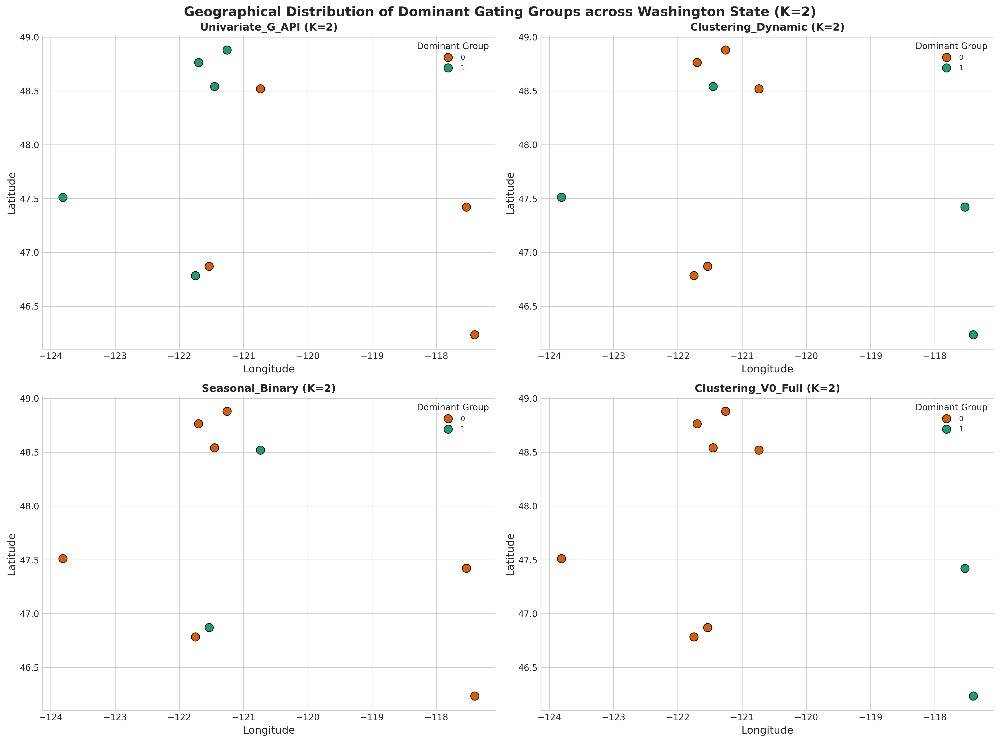

In [8]:
def plot_geographic_stations(df, strategy_name, K, palette, ax):
    # Retrieve labels for the strategy
    labels = get_labels_for_strategy(df, strategy_name, K)
    
    # Temp DataFrame with station coordinates and labels
    df_temp = df[['station_id', 'longitude', 'latitude']].copy()
    df_temp['Group'] = labels
    
    # Mode per station
    station_gps = df_temp.groupby('station_id').agg({
        'longitude': 'first',
        'latitude': 'first',
        'Group': lambda x: x.mode()[0] if len(x) > 0 else 0
    }).reset_index()
    
    sns.scatterplot(
        data=station_gps,
        x='longitude',
        y='latitude',
        hue='Group',
        palette=palette,
        s=90,
        edgecolor='black',
        linewidth=0.8,
        ax=ax,
        legend='full'
    )
    
    ax.set_title(f"{strategy_name} (K={K})", fontweight='bold', fontsize=12)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.spines[["top", "right"]].set_visible(False)
    ax.legend(title="Dominant Group", fontsize=8, loc='best')

# 2x2 grid for K=2 geographic maps
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

map_configs = [
    {"name": "Univariate_G_API", "K": 2},
    {"name": "Clustering_Dynamic", "K": 2},
    {"name": "Seasonal_Binary", "K": 2},
    {"name": "Clustering_V0_Full", "K": 2}
]

for idx, cfg in enumerate(map_configs):
    ax = axes[idx]
    plot_geographic_stations(train_df, cfg["name"], cfg["K"], PALETTE_K2, ax)

plt.suptitle("Geographical Distribution of Dominant Gating Groups across Washington State (K=2)", fontsize=15, fontweight="bold", y=0.98)
plt.tight_layout()
plt.savefig("gating_geographic_distribution.png", dpi=300)
plt.show()

## 9. Advanced Clustering Separation Diagnostics (K=2 Focus)

We perform detailed evaluations of how well observation points are separated by our clustering-based gating strategies:
1. **Quality Metrics vs K**: Plot the Elbow Curve (Inertia) and Average Silhouette Score for $K \in [2, 6]$ to benchmark $K=2$.
2. **Silhouette Profile Plots**: Silhouette coefficient distributions for $K=2$ (`Clustering_Dynamic` and `Clustering_V0_Full`).
3. **t-SNE 2D Projections**: Project the high-dimensional feature space to a 2D plane via t-SNE for $K=2$.
4. **Cluster Centroid Distance Ratio**: Measure ratio of distance to own centroid vs nearest other centroid ($d_{\text{own}} / d_{\text{other}}$) for $K=2$.

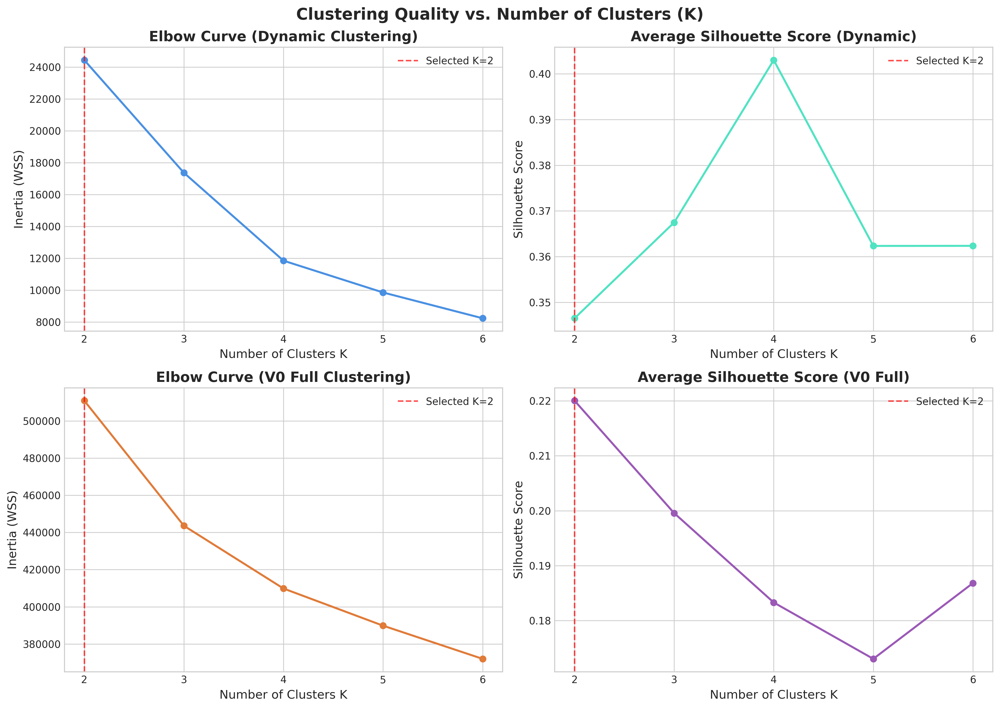

In [9]:
# 1. Elbow & Silhouette Analysis vs K
K_range = [2, 3, 4, 5, 6]

X_dyn = prepare_clustering_data(train_df, ["SMAP_sm_pm_interp_lag1", "G_API", "LST_modis"])
X_v0 = prepare_clustering_data(train_df, OVERALL_SELECTED_FEATURES_V0)

# Sample 3000 indices for silhouette speed
np.random.seed(42)
sample_idx = np.random.choice(len(train_df), size=min(3000, len(train_df)), replace=False)

metrics = {
    "Dynamic": {"inertia": [], "silhouette": []}, 
    "V0_Full": {"inertia": [], "silhouette": []}
}

for K in K_range:
    # Dynamic
    km_dyn = KMeans(n_clusters=K, random_state=42, n_init=10)
    lbl_dyn = km_dyn.fit_predict(X_dyn)
    metrics["Dynamic"]["inertia"].append(km_dyn.inertia_)
    metrics["Dynamic"]["silhouette"].append(silhouette_score(X_dyn[sample_idx], lbl_dyn[sample_idx]))
    
    # V0 Full
    km_v0 = KMeans(n_clusters=K, random_state=42, n_init=10)
    lbl_v0 = km_v0.fit_predict(X_v0)
    metrics["V0_Full"]["inertia"].append(km_v0.inertia_)
    metrics["V0_Full"]["silhouette"].append(silhouette_score(X_v0[sample_idx], lbl_v0[sample_idx]))

# Plot Metrics
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Dynamic curves
axes[0, 0].plot(K_range, metrics["Dynamic"]["inertia"], marker='o', color="#4A90E2", linewidth=2)
axes[0, 0].axvline(x=2, color="red", linestyle="--", alpha=0.7, label="Selected K=2")
axes[0, 0].set_title("Elbow Curve (Dynamic Clustering)", fontweight="bold")
axes[0, 0].set_xlabel("Number of Clusters K")
axes[0, 0].set_ylabel("Inertia (WSS)")
axes[0, 0].set_xticks(K_range)
axes[0, 0].legend()

axes[0, 1].plot(K_range, metrics["Dynamic"]["silhouette"], marker='o', color="#50E3C2", linewidth=2)
axes[0, 1].axvline(x=2, color="red", linestyle="--", alpha=0.7, label="Selected K=2")
axes[0, 1].set_title("Average Silhouette Score (Dynamic)", fontweight="bold")
axes[0, 1].set_xlabel("Number of Clusters K")
axes[0, 1].set_ylabel("Silhouette Score")
axes[0, 1].set_xticks(K_range)
axes[0, 1].legend()

# V0 Full curves
axes[1, 0].plot(K_range, metrics["V0_Full"]["inertia"], marker='o', color="#E07B39", linewidth=2)
axes[1, 0].axvline(x=2, color="red", linestyle="--", alpha=0.7, label="Selected K=2")
axes[1, 0].set_title("Elbow Curve (V0 Full Clustering)", fontweight="bold")
axes[1, 0].set_xlabel("Number of Clusters K")
axes[1, 0].set_ylabel("Inertia (WSS)")
axes[1, 0].set_xticks(K_range)
axes[1, 0].legend()

axes[1, 1].plot(K_range, metrics["V0_Full"]["silhouette"], marker='o', color="#9B59B6", linewidth=2)
axes[1, 1].axvline(x=2, color="red", linestyle="--", alpha=0.7, label="Selected K=2")
axes[1, 1].set_title("Average Silhouette Score (V0 Full)", fontweight="bold")
axes[1, 1].set_xlabel("Number of Clusters K")
axes[1, 1].set_ylabel("Silhouette Score")
axes[1, 1].set_xticks(K_range)
axes[1, 1].legend()

plt.suptitle("Clustering Quality vs. Number of Clusters (K)", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig("clustering_metrics_comparison.png", dpi=300)
plt.show()

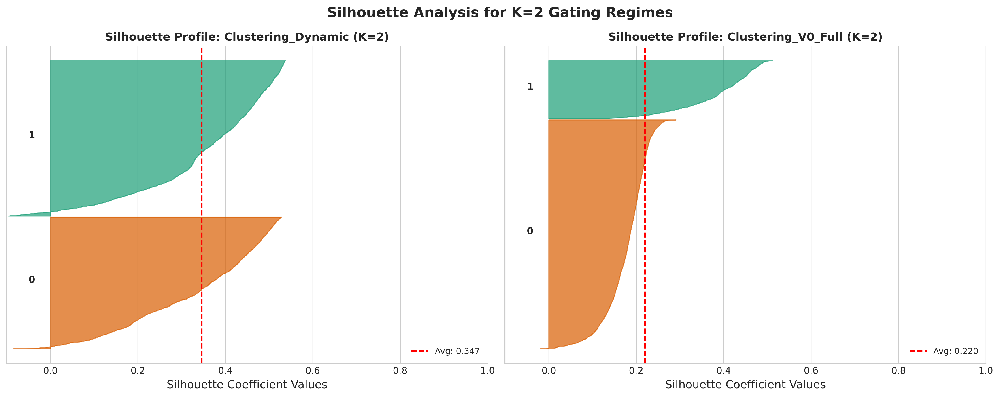

In [10]:
# 2. Silhouette Profile Plots for K=2 (Clustering_Dynamic and Clustering_V0_Full)
def plot_silhouette_profile(X, labels, name, ax):
    avg_score = silhouette_score(X[sample_idx], labels[sample_idx])
    sample_values = silhouette_samples(X[sample_idx], labels[sample_idx])
    
    y_lower = 10
    for i in range(2):
        ith_cluster_values = sample_values[labels[sample_idx] == i]
        ith_cluster_values.sort()
        
        size_cluster_i = ith_cluster_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        color = PALETTE_K2[i]
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_values,
                          facecolor=color, edgecolor=color, alpha=0.7)
        
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i), fontsize=10, fontweight="bold")
        y_lower = y_upper + 10
        
    ax.set_title(f"Silhouette Profile: {name} (K=2)", fontweight="bold", fontsize=12)
    ax.set_xlabel("Silhouette Coefficient Values")
    ax.axvline(x=avg_score, color="red", linestyle="--", linewidth=1.5, label=f"Avg: {avg_score:.3f}")
    ax.set_yticks([])
    ax.set_xlim([-0.1, 1.0])
    ax.legend(loc="lower right", fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

labels_dyn_k2 = get_labels_for_strategy(train_df, "Clustering_Dynamic", 2)
labels_v0_k2 = get_labels_for_strategy(train_df, "Clustering_V0_Full", 2)

plot_silhouette_profile(X_dyn, labels_dyn_k2, "Clustering_Dynamic", axes[0])
plot_silhouette_profile(X_v0, labels_v0_k2, "Clustering_V0_Full", axes[1])

plt.suptitle("Silhouette Analysis for K=2 Gating Regimes", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("clustering_silhouette_profiles.png", dpi=300)
plt.show()

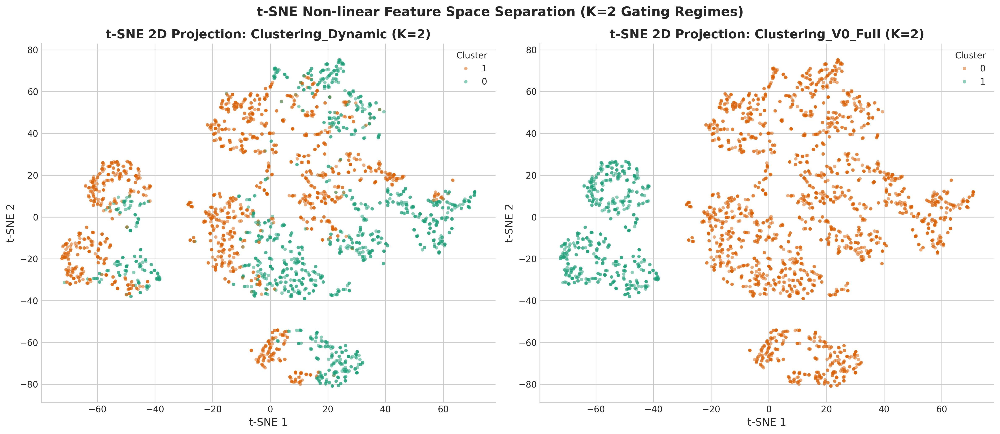

In [11]:
# 3. t-SNE 2D Projections for K=2
tsne = TSNE(n_components=2, perplexity=30, random_state=42, max_iter=1000)
X_v0_tsne = tsne.fit_transform(X_v0[sample_idx])

df_tsne = pd.DataFrame(X_v0_tsne, columns=["t-SNE 1", "t-SNE 2"])
df_tsne["Clustering_Dynamic K=2"] = labels_dyn_k2[sample_idx].astype(str)
df_tsne["Clustering_V0_Full K=2"] = labels_v0_k2[sample_idx].astype(str)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Dynamic K=2 scatter
sns.scatterplot(
    data=df_tsne,
    x="t-SNE 1",
    y="t-SNE 2",
    hue="Clustering_Dynamic K=2",
    palette=PALETTE_K2,
    alpha=0.5,
    edgecolor="none",
    s=15,
    ax=axes[0]
)
axes[0].set_title("t-SNE 2D Projection: Clustering_Dynamic (K=2)", fontweight="bold")
axes[0].spines[["top", "right"]].set_visible(False)
axes[0].legend(title="Cluster")

# V0 Full K=2 scatter
sns.scatterplot(
    data=df_tsne,
    x="t-SNE 1",
    y="t-SNE 2",
    hue="Clustering_V0_Full K=2",
    palette=PALETTE_K2,
    alpha=0.5,
    edgecolor="none",
    s=15,
    ax=axes[1]
)
axes[1].set_title("t-SNE 2D Projection: Clustering_V0_Full (K=2)", fontweight="bold")
axes[1].spines[["top", "right"]].set_visible(False)
axes[1].legend(title="Cluster")

plt.suptitle("t-SNE Non-linear Feature Space Separation (K=2 Gating Regimes)", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("clustering_tsne_projection.png", dpi=300)
plt.show()

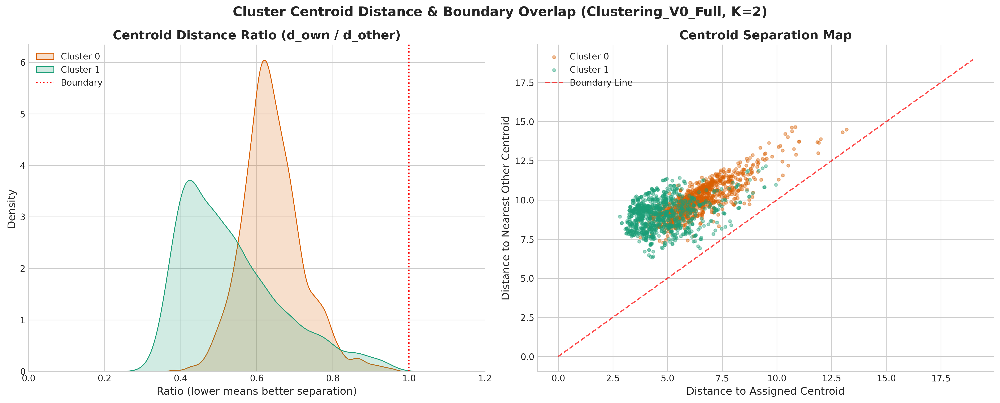

In [12]:
# 4. Cluster Centroid Distance Distributions for Clustering_V0_Full (K=2)
kmeans_v0_k2 = KMeans(n_clusters=2, random_state=42, n_init=10)
kmeans_v0_k2.fit(X_v0)
centroids = kmeans_v0_k2.cluster_centers_

# Distances to centroids
dists = []
for c in centroids:
    dist_c = np.linalg.norm(X_v0 - c, axis=1)
    dists.append(dist_c)
dists = np.column_stack(dists)

assigned_clusters = kmeans_v0_k2.labels_
dist_to_own = dists[np.arange(len(X_v0)), assigned_clusters]

dists_temp = dists.copy()
dists_temp[np.arange(len(X_v0)), assigned_clusters] = np.inf
dist_to_nearest_other = dists_temp.min(axis=1)

dist_ratio = dist_to_own / dist_to_nearest_other

fig, axes = plt.subplots(1, 2, figsize=(16, 6.5))

# Ratio KDE
ax_ratio = axes[0]
for i in range(2):
    mask = (assigned_clusters == i)
    sns.kdeplot(dist_ratio[mask], ax=ax_ratio, label=f"Cluster {i}", color=PALETTE_K2[i], fill=True, alpha=0.2)
ax_ratio.axvline(x=1.0, color="red", linestyle=":", linewidth=1.5, label="Boundary")
ax_ratio.set_title("Centroid Distance Ratio (d_own / d_other)", fontweight="bold")
ax_ratio.set_xlabel("Ratio (lower means better separation)")
ax_ratio.legend()
ax_ratio.spines[["top", "right"]].set_visible(False)
ax_ratio.set_xlim(0, 1.2)

# Centroid Separation Map
ax_scatter = axes[1]
for i in range(2):
    mask = (assigned_clusters == i)
    sub_mask = np.random.choice(np.where(mask)[0], size=min(1000, mask.sum()), replace=False)
    ax_scatter.scatter(
        dist_to_own[sub_mask], 
        dist_to_nearest_other[sub_mask], 
        color=PALETTE_K2[i], 
        alpha=0.4, 
        s=12, 
        label=f"Cluster {i}"
    )
lims = [0, max(dist_to_own.max(), dist_to_nearest_other.max())]
ax_scatter.plot(lims, lims, 'r--', alpha=0.7, label='Boundary Line')
ax_scatter.set_title("Centroid Separation Map", fontweight="bold")
ax_scatter.set_xlabel("Distance to Assigned Centroid")
ax_scatter.set_ylabel("Distance to Nearest Other Centroid")
ax_scatter.legend()
ax_scatter.spines[["top", "right"]].set_visible(False)

plt.suptitle("Cluster Centroid Distance & Boundary Overlap (Clustering_V0_Full, K=2)", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig("clustering_centroid_distances.png", dpi=300)
plt.show()

## 10. Export Clustering Parameters

We fit and export the complete clustering pipeline parameters for both `Clustering_Dynamic` ($K=2$) and `Clustering_V0_Full` ($K=2$).

Exported parameter artifacts:
- `clustering_params_dynamic_k2.json` and `.joblib`
- `clustering_params_v0_full_k2.json` and `.joblib`
- `clustering_params_k2_combined.json` (Combined registry)

Each JSON file stores:
- `strategy`: Strategy identifier
- `K`: Number of clusters (2)
- `features`: Ordered feature name list
- `impute_means`: Feature column means computed on `train.csv` for missing value handling
- `scaler_mean`: StandardScaler fitted means ($\mu$)
- `scaler_scale`: StandardScaler fitted scale ($\sigma$)
- `cluster_centers`: KMeans cluster centroids ($K \times D$)

In [13]:
# Helper to fit and export clustering parameters
def fit_and_export_clusterer(df, features, strategy_name, K=2):
    # 1. Compute imputation means on train split
    X_raw = df[features].copy()
    impute_means = X_raw.mean().to_dict()
    
    # 2. Impute and scale
    X_imputed = X_raw.fillna(pd.Series(impute_means))
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_imputed)
    
    # 3. Fit KMeans
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    
    # 4. Construct params dictionary
    params = {
        "strategy": strategy_name,
        "K": K,
        "features": list(features),
        "impute_means": {k: float(v) for k, v in impute_means.items()},
        "scaler_mean": [float(v) for v in scaler.mean_],
        "scaler_scale": [float(v) for v in scaler.scale_],
        "cluster_centers": [[float(val) for val in row] for row in kmeans.cluster_centers_]
    }
    
    # 5. Export JSON
    json_filename = f"clustering_params_{strategy_name.lower()}_k{K}.json"
    with open(json_filename, "w", encoding="utf-8") as f:
        json.dump(params, f, indent=2)
        
    # 6. Export Joblib bundle for fast loading
    joblib_filename = f"clustering_params_{strategy_name.lower()}_k{K}.joblib"
    joblib.dump({
        "features": list(features),
        "impute_means": pd.Series(impute_means),
        "scaler": scaler,
        "kmeans": kmeans
    }, joblib_filename)
    
    print(f"Exported {strategy_name} (K={K}) parameters to '{json_filename}' and '{joblib_filename}'")
    return params

# Export Dynamic and V0_Full clustering parameters
params_dyn = fit_and_export_clusterer(train_df, ["SMAP_sm_pm_interp_lag1", "G_API", "LST_modis"], "dynamic", K=2)
params_v0  = fit_and_export_clusterer(train_df, OVERALL_SELECTED_FEATURES_V0, "v0_full", K=2)

# Export combined registry JSON
combined_registry = {
    "dataset_split": "derived_8.3",
    "K": 2,
    "strategies": {
        "Clustering_Dynamic": params_dyn,
        "Clustering_V0_Full": params_v0
    }
}
with open("clustering_params_k2_combined.json", "w", encoding="utf-8") as f:
    json.dump(combined_registry, f, indent=2)

print("\nExported combined registry to 'clustering_params_k2_combined.json'")

# --- VERIFICATION STEP ---
print("\n=== VERIFICATION: Reloading parameters and predicting on Val split ===")
def predict_from_json(df, json_params):
    feats = json_params["features"]
    imp_means = pd.Series(json_params["impute_means"])
    sc_mean = np.array(json_params["scaler_mean"])
    sc_scale = np.array(json_params["scaler_scale"])
    centroids = np.array(json_params["cluster_centers"])
    
    X_val = df[feats].copy().fillna(imp_means).values
    X_scaled = (X_val - sc_mean) / sc_scale
    
    # Distance to centroids
    dists = np.linalg.norm(X_scaled[:, np.newaxis, :] - centroids[np.newaxis, :, :], axis=2)
    return np.argmin(dists, axis=1)

# Verify on val split
pred_val_json = predict_from_json(val_df, params_v0)
joblib_bundle = joblib.load("clustering_params_v0_full_k2.joblib")
X_val_imp = val_df[joblib_bundle["features"]].fillna(joblib_bundle["impute_means"])
pred_val_joblib = joblib_bundle["kmeans"].predict(joblib_bundle["scaler"].transform(X_val_imp))

match_pct = (pred_val_json == pred_val_joblib).mean() * 100
print(f"Validation label prediction agreement between JSON & Joblib models: {match_pct:.2f}%")
assert match_pct == 100.0, "Verification failed: predictions do not match exactly!"
print("Verification SUCCESS: Reloaded parameter prediction matches Joblib model 100%!")

Exported dynamic (K=2) parameters to 'clustering_params_dynamic_k2.json' and 'clustering_params_dynamic_k2.joblib'
Exported v0_full (K=2) parameters to 'clustering_params_v0_full_k2.json' and 'clustering_params_v0_full_k2.joblib'

Exported combined registry to 'clustering_params_k2_combined.json'

=== VERIFICATION: Reloading parameters and predicting on Val split ===
Validation label prediction agreement between JSON & Joblib models: 100.00%
Verification SUCCESS: Reloaded parameter prediction matches Joblib model 100%!
